In [3]:
## general imports
import pandas as pd
import numpy as np
import os, sys, gc, warnings
import matplotlib.pylab as plt
import seaborn as sns
import missingno as msno
warnings.simplefilter("ignore")


## Overview

The data set is separated in to two tables. Train_transaction contains information about transaction and train_identity contains information about customers.The objective of this project is to predict if an online transaction in the dataset is fraudulent or not. Most of the data is heavily anonimized but there are some hints given by the data provider. The target variable is 'isFraud'. Noting that only apporoximately 25% of the transaction dataset has associated identity data, this part of the analysis is only base on the transaction dataset.  I would like to see if using the identity dataset adds any value to model predictions in a later stage.  Based on that information, in the transaction dataset

Numerical features 

    C1-C15 (discreet):  counts of phone numbers, emails, names, device, IP address, billing address, etc for both purchaser and recipient.
    D1-D15 (discreet) : timedelta vaues (D1= time since the first transaction , time since email address was used, time since last transaction etc)
    V features (V1-V339) (discreet) : anonymous  engineered features as well as row features
    TransactionDT: timedelta corresponding to date of purchase
    TransactionAmt : purchase amount in USD

Categorical features

    ProductCD : 
    P_emaildomain: purchaser email domain
    R_emaildomain : recipient email domain
    M1-M9 : attribute of matching check. eg. is phone area code matching billing zipcode? purchaser and recipient first and last names match? etc
    card 4: specific card type ( american express, mastercard etc) 
    card 6 : debit or credit
    card 1,3,5 : numerical values 
    add1, add2: purchaser billing region, billing country
    

The aim of the EDA is to answer the following questions and preprocess the data to use in a model. 

    What type of data we have?
    How many unique and  missing values do we have?
    Whats the target distribution like?
    Is there a difference in features between fraud and non-fraud transactions?
    What features show  interesting patterns?
    What does the correlation analysis tell us about the features? 

In [ ]:
## read data
identity = pd.read_csv ("C:/Users/hawia/Documents/Capstone/data/train_identity.csv" )
transaction = pd.read_csv ( "C:/Users/hawia/Documents/Capstone/data/train_transaction.csv" )
## shape of data
print (f'Transaction dataset has {transaction.shape[0]} rows and {transaction.shape[1]} columns')
print (f'Identity dataset has {identity.shape[0]} rows and {identity.shape[1]} columns')

In [ ]:
transaction.head()

In [ ]:
identity.head()

In [ ]:
# merge the transaction and identity tables (left join)

df = pd.merge (transaction, identity, on = "TransactionID", how = "left")
print (f'There are {df.shape[0]} rows and {df.shape[1]} columns in the df')

In [ ]:
# check how much of the transaction data has associated identitiy information

count_match = np.sum (transaction.index.isin (identity.index.unique()))
match_percentage= np.round(100 * count_match / len (df))
print (f'There are {count_match}, {match_percentage} % transactions with associated identity data')
del transaction, identity
gc.collect()

In [ ]:
# memmory reduction function borrowed from ...https://www.kaggle.com/kyakovlev/ieee-data-minification
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage(deep=True).sum() / 1024 ** 2 # just added 
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage(deep=True).sum() / 1024 ** 2
    percent = 100 * (start_mem - end_mem) / start_mem
    print('Mem. usage decreased from {:5.2f} Mb to {:5.2f} Mb ({:.1f}% reduction)'.format(start_mem, end_mem, percent))
    return df

In [ ]:
# dataframe with reduced memory usage
df_reduced = reduce_mem_usage(df)
df_reduced.to_pickle('df_pkl.pkl')
# dataframe with only transaction data
df_tran = reduce_mem_usage(transaction)
df_tran.to_pickle ('pickled.pkl')

In [4]:
# transaction only dataframe 
df_trans = pd.read_pickle ('pickled.pkl')

In [54]:
df_trans.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.0,588975.0,586281.0,524834.0,524834.0,...,82351.000000,82351.000000,82351.000000,82351.000000,82351.0,82351.0,82351.0,82351.000000,82351.000000,82351.000000
mean,3.282270e+06,0.034990,7.372311e+06,NaN,9898.734658,NaN,NaN,NaN,NaN,NaN,...,0.775391,721.741455,1375.778564,1014.619934,NaN,NaN,NaN,55.352417,151.160538,100.700874
std,1.704744e+05,0.183755,4.617224e+06,NaN,4901.170153,NaN,0.0,0.0,NaN,0.0,...,0.000000,6217.229980,11169.515625,7955.782227,NaN,NaN,NaN,668.375854,1095.057739,814.953247
min,2.987000e+06,0.000000,8.640000e+04,0.250977,1000.000000,100.0,100.0,100.0,100.0,10.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.312500,6019.000000,214.0,150.0,166.0,204.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.750000,9678.000000,361.0,150.0,226.0,299.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.0,150.0,226.0,330.0,87.0,...,0.000000,0.000000,25.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
max,3.577539e+06,1.000000,1.581113e+07,31936.000000,18396.000000,600.0,231.0,237.0,540.0,102.0,...,55.000000,160000.000000,160000.000000,160000.000000,55136.0,55136.0,55136.0,104060.000000,104060.000000,104060.000000


Text(0.5, 1.0, 'Distribution of Fraud vs not Fraud')

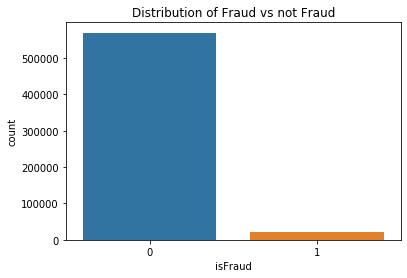

In [6]:
# check target distribution 
sns.countplot(x = 'isFraud', data = df_trans)
plt.title ('Distribution of Fraud vs not Fraud')

## Define some plotting and summary functions

In [70]:
# function to plot numeric features (feature vs time (TransactionDT))
def numeric(col):
    #df_trans.set_index('TransactionDT')[col].plot(style='.', title = col +"values over time", figsize =(15,3))
    df_trans[df_trans['isFraud'] == 0].set_index('TransactionDT')[col].plot(style='.',title = col + ' values over time (blue=no-fraud, orange=fraud)' , figsize=(15, 3))
    df_trans[df_trans['isFraud'] == 1].set_index('TransactionDT')[col].plot(style='.',title =col + ' values over time (blue=no-fraud, orange=fraud)' , figsize=(15, 3))
    plt.show
      
    
# summary statistics     
def summ_stats(df): 
    perc_missing = np.round((df.isna().sum()/len(df))*100, 4)
    unique = df.nunique (dropna = False)
    nulls = pd.DataFrame (index = None, data = {'unique' : unique,  'perc_missing' : perc_missing, 'col_name' : df.columns})\
                .reset_index().drop('index',axis=1)
    return nulls

# function to plot categorical features (non-numeric)
def categorical(df, col, lim=2000):
    df_trans[col] = df[col].fillna("Missing")
    plt.figure(figsize=(15,3))
    plt.subplot(121)
    g= sns.countplot(x= col, data = df, hue ="isFraud")
    g.set_title(f"{col}", fontsize=18)
    g.set_xlabel("Category", fontsize=16)
    g.set_ylabel("Count", fontsize=16)
    plt.show()
    
# function to plot correlation 
def correlated (col):
    plt.figure(figsize=(15,15))
    sns.heatmap(df_trans[col].corr(), cmap='RdBu_r', annot=True, center=0.0)
    plt.show()

# Search for similarity between features based on their NaN structure
We see that a lot of features share a similar Nan structure which may show a relationship between them. Als, there are a lot of features with more than 50% missing data. 

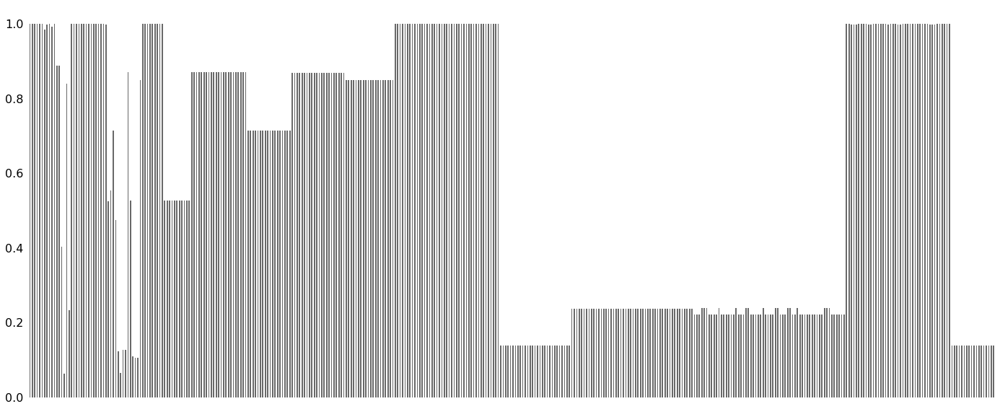

In [37]:
## check for any similarity in nan structure
msno.bar(df_trans)

,perc_missing,col_name
35,93.6284,[dist2]
34,93.4099,[D7]
33,89.5093,[D13]
32,89.4695,[D14]
31,89.0410,[D12]
30,87.6068,[D6]
29,87.3123,"[D8, D9]"
28,86.1237,"[V138, V139, V140, V141, V142, V146, V147, V148, V149, V153, V154, V155, V156, V157, V158, V161, V162, V163]"
27,86.1227,"[V143, V144, V145, V150, V151, V152, V159, V160, V164, V165, V166]"
26,86.0550,"[V322, V323, V324, V325, V326, V327, V328, V329, V330, V331, V332, V333, V334, V335, V336, V337, V338, V339]"


In [91]:
# columns grouped by the percentage of missing data
pd.options.display.max_colwidth =500
col_na_group= summ_stats(df_trans).groupby('perc_missing')['col_name']\
                                    .unique().reset_index()\
                                    .sort_values('perc_missing', ascending = False)
col_na_group

,perc_missing,col_name
35,93.6284,[dist2]
34,93.4099,[D7]
33,89.5093,[D13]
32,89.4695,[D14]
31,89.0410,[D12]
30,87.6068,[D6]
29,87.3123,"[D8, D9]"
28,86.1237,"[V138, V139, V140, V141, V142, V146, V147, V148, V149, V153, V154, V155, V156, V157, V158, V161, V162, V163]"
27,86.1227,"[V143, V144, V145, V150, V151, V152, V159, V160, V164, V165, V166]"
26,86.0550,"[V322, V323, V324, V325, V326, V327, V328, V329, V330, V331, V332, V333, V334, V335, V336, V337, V338, V339]"


## checking for TransactionAmt

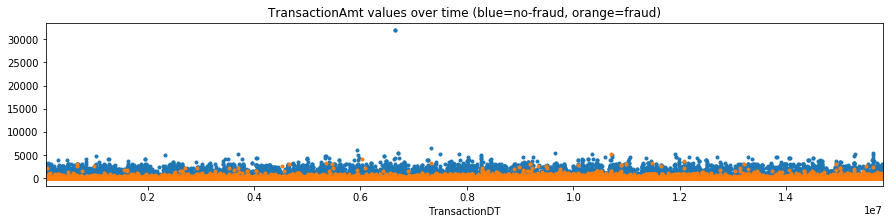

In [57]:
for col in ['TransactionAmt']:
    numeric (col)

## Checking for C features

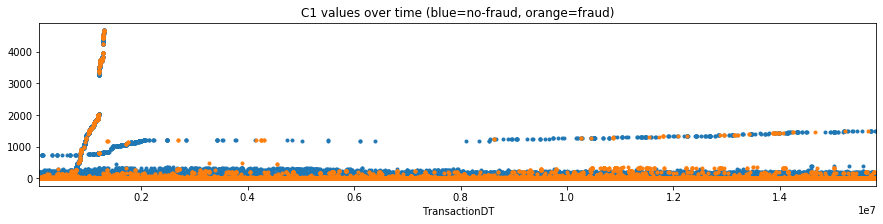

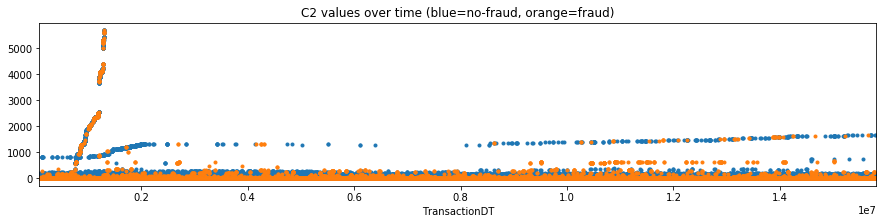

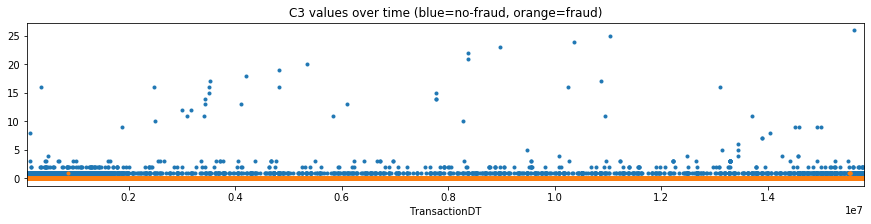

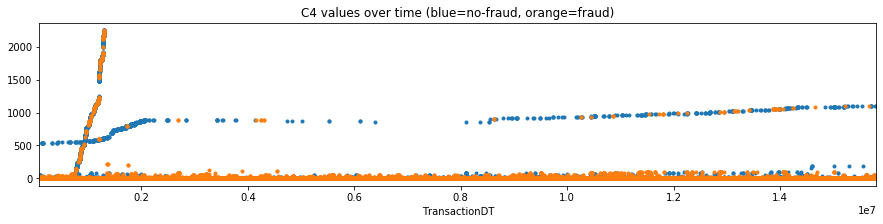

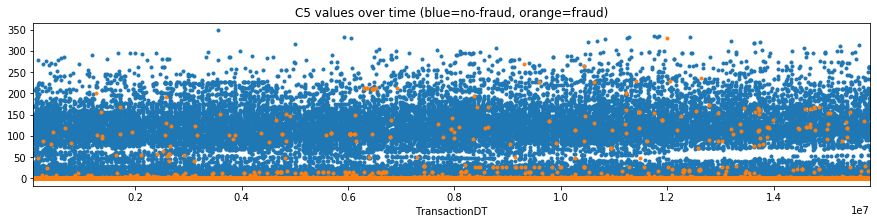

...

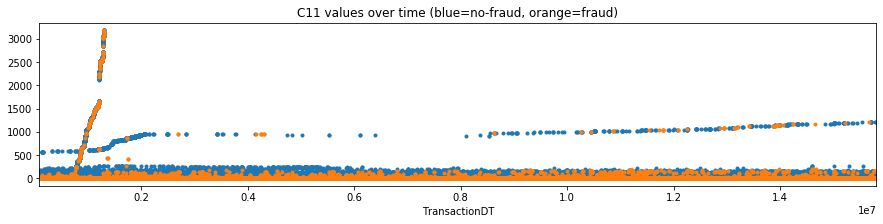

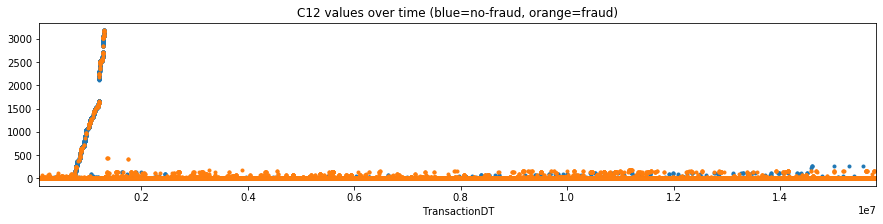

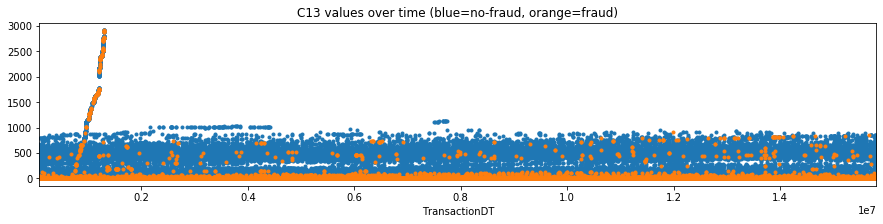

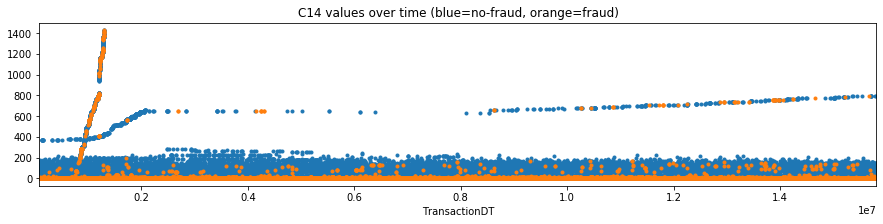

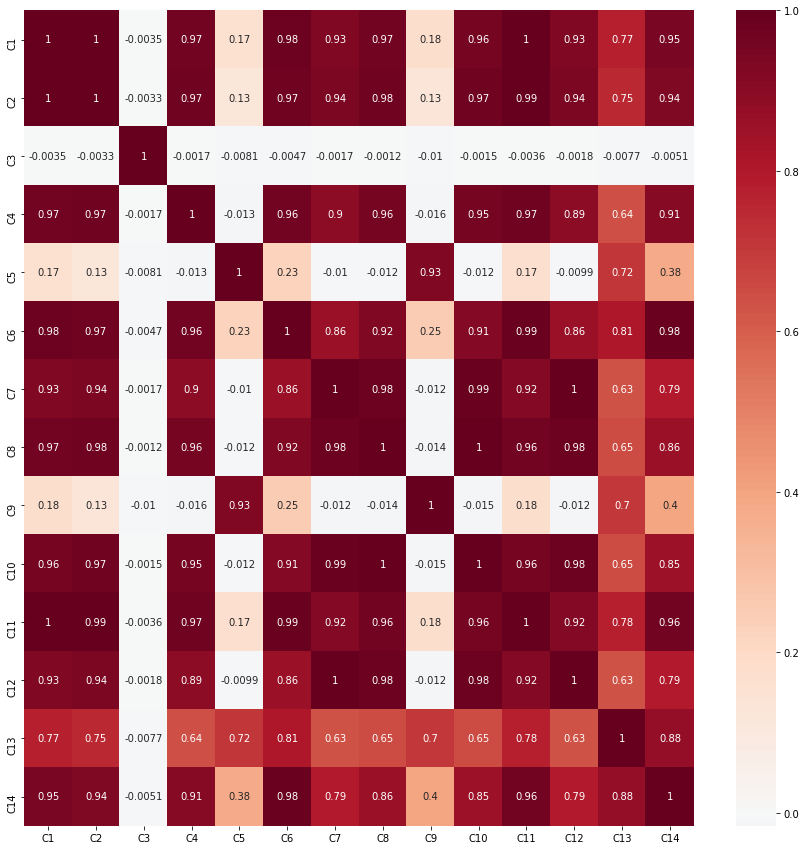

In [82]:
Cs = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
for col in Cs:
    numeric(col)
    plt.show()
correlated (Cs)

## Checking for V features

In [92]:
summ_stats (df_trans[Cs])

,unique,perc_missing,col_name
0,1495,0.0,C1
1,1167,0.0,C2
2,27,0.0,C3
3,1223,0.0,C4
4,319,0.0,C5
5,1291,0.0,C6
6,1069,0.0,C7
7,1130,0.0,C8
8,205,0.0,C9
9,1122,0.0,C10


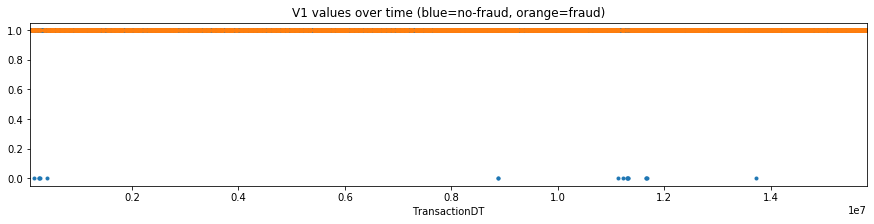

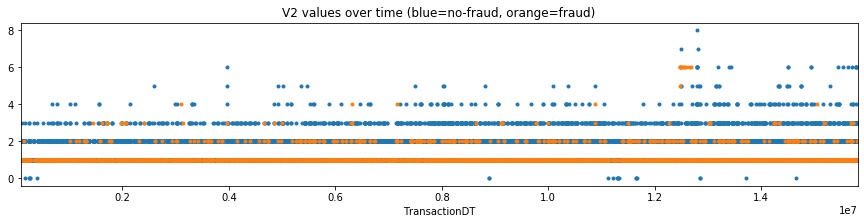

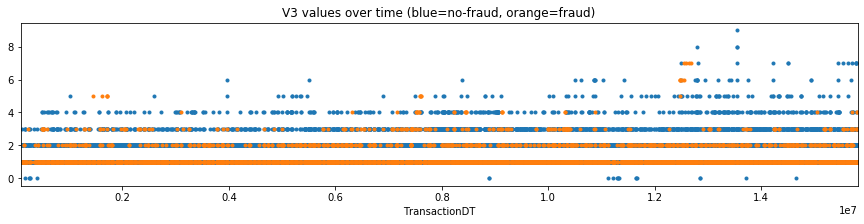

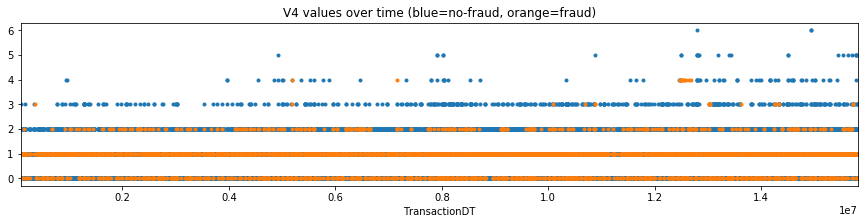

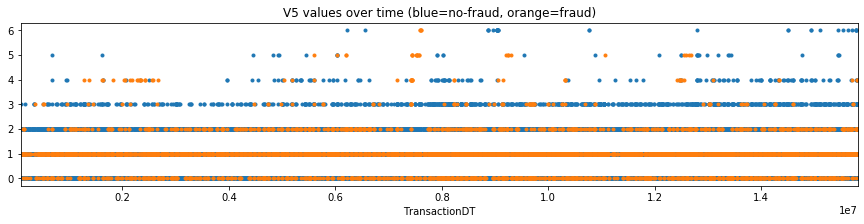

...

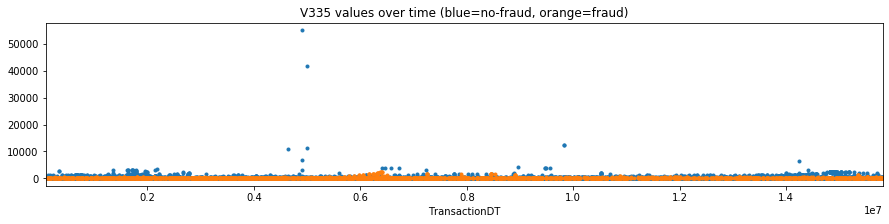

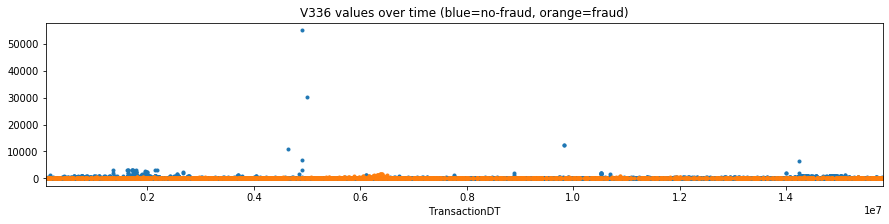

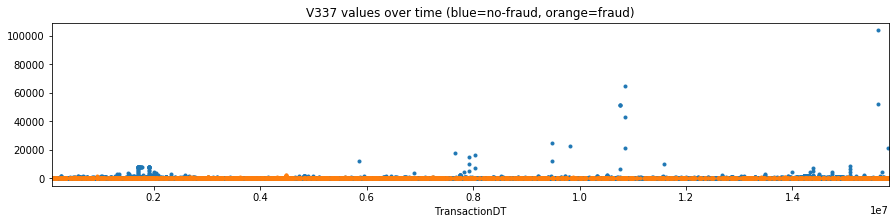

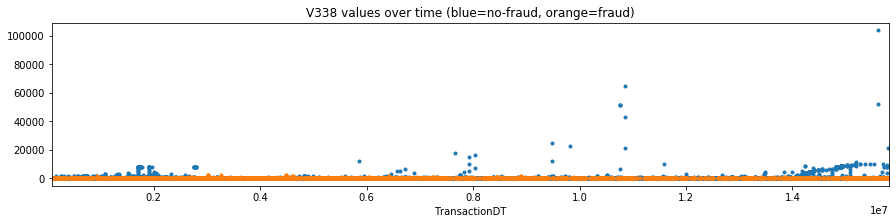

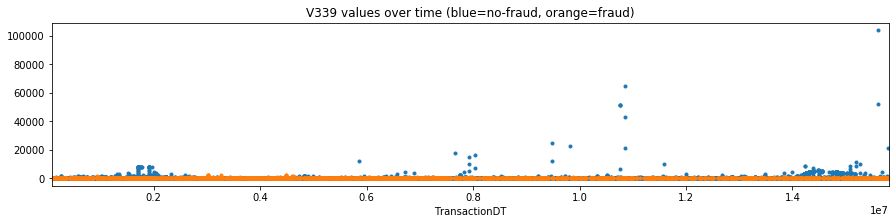

In [42]:
# checking V features 
Vs = [col for col in df_trans if col.startswith('V')]

for col in Vs:
    numeric(col)
    plt.show()
    
    


In [90]:
df_trans[Vs].describe(include = 'all' )


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,...,82351.000000,82351.000000,82351.000000,82351.000000,82351.0,82351.0,82351.0,82351.000000,82351.000000,82351.000000
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.775391,721.741455,1375.778564,1014.619934,NaN,NaN,NaN,55.352417,151.160538,100.700874
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,6217.229980,11169.515625,7955.782227,NaN,NaN,NaN,668.375854,1095.057739,814.953247
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
25%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
50%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
75%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.000000,0.000000,25.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
max,1.0,8.0,9.0,6.0,6.0,9.0,9.0,8.0,8.0,4.0,...,55.000000,160000.000000,160000.000000,160000.000000,55136.0,55136.0,55136.0,104060.000000,104060.000000,104060.000000


## Checking for D features

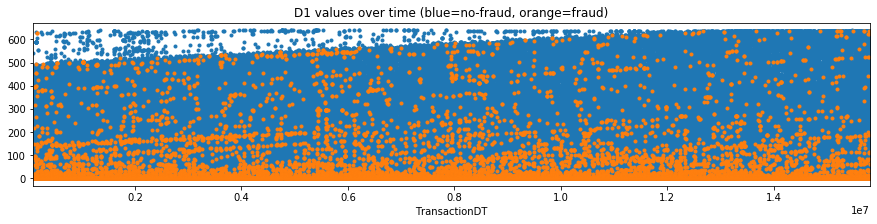

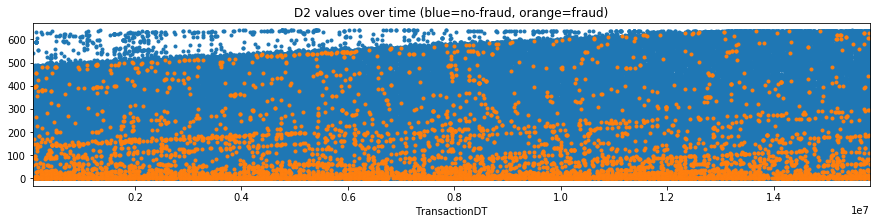

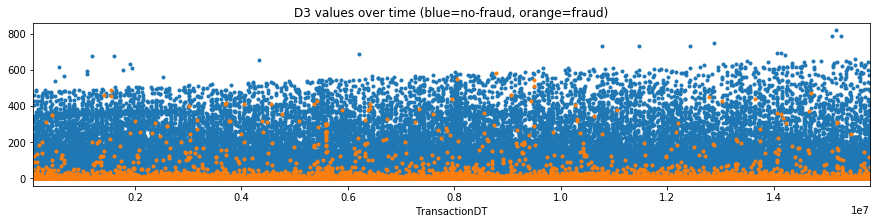

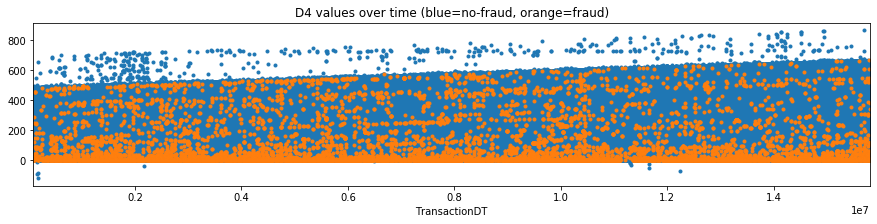

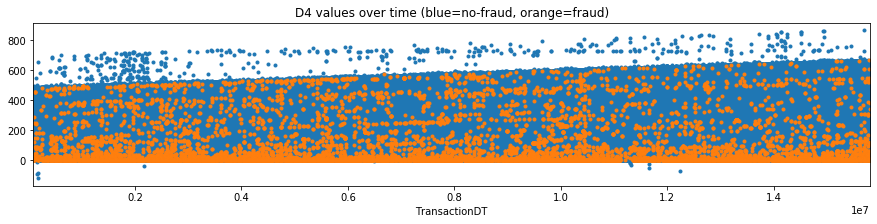

...

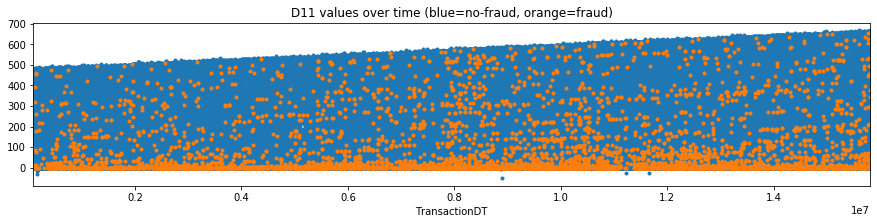

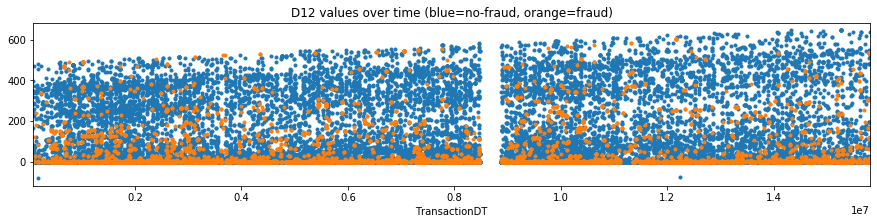

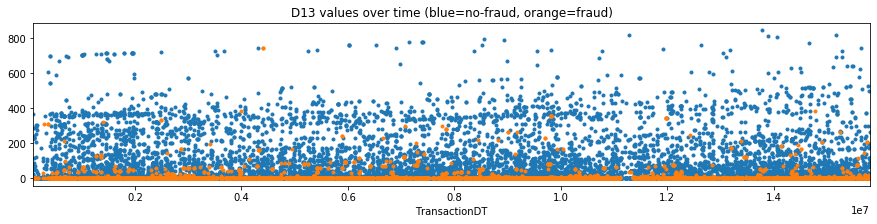

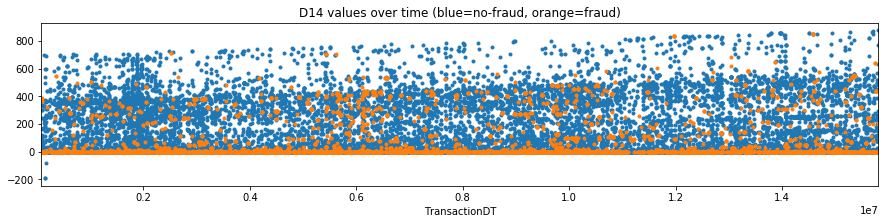

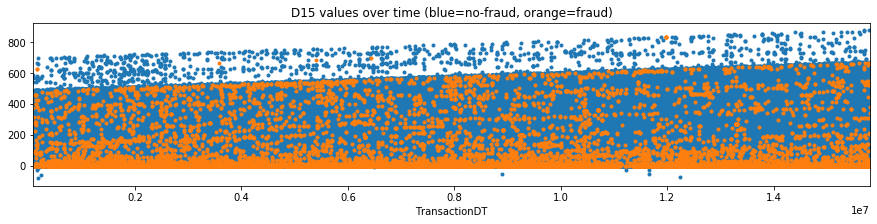

In [67]:
# checking D features
Ds= ['D1', 'D2', 'D3', 'D4', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12','D13', 'D14', 'D15']
for col in Ds:
    numeric (col)
    plt.show()


## Checking for the distribution of TransactionAmt by target

In [ ]:
# distribution of TransactionAmt by target
plt.figure(figsize=(16, 6))
sns.boxplot(x="isFraud", y="TransactionAmt", data=df_trans, orient = 'h')
plt.show()
# notice the outlier...and get rid of it


In [ ]:
d_trans= df_trans[df_trans.TransactionAmt < 31000]
sns.hist(x= 'isFraud', y= 'TransactionAmt', data = d_trans, orient = 'h')
plt.ylim(0, 10000)



## Checking for M features

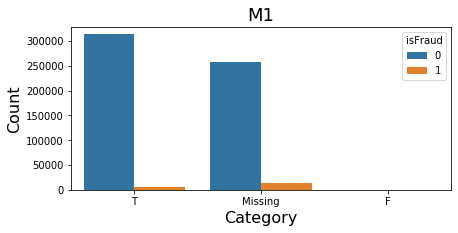

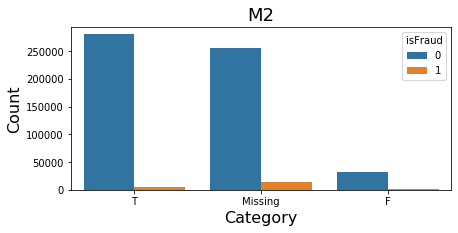

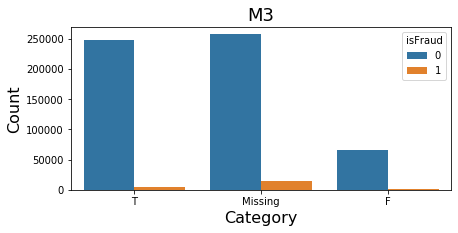

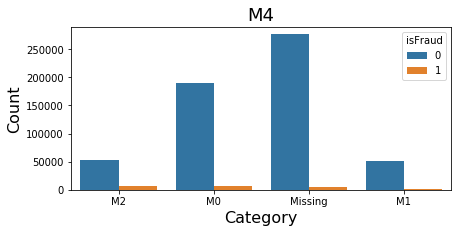

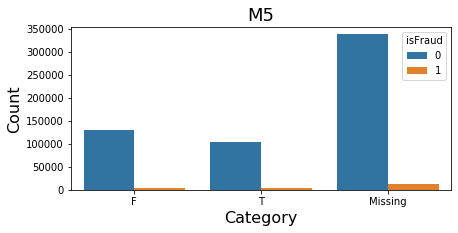

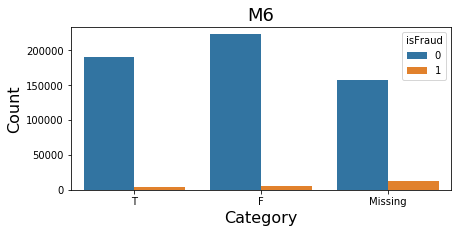

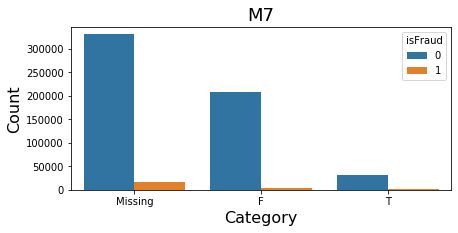

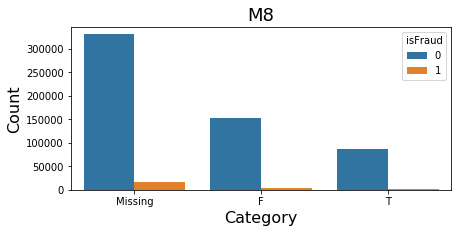

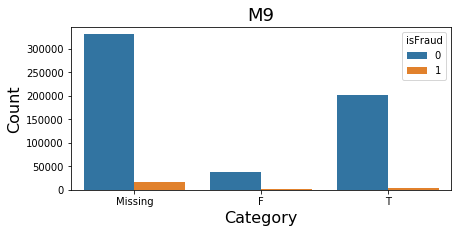

In [94]:
Ms = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']
for col in Ms :
    categorical(df_trans, col)


In [95]:
summ_stats (df_trans[Ms])

,unique,perc_missing,col_name
0,3,0.0,M1
1,3,0.0,M2
2,3,0.0,M3
3,4,0.0,M4
4,3,0.0,M5
5,3,0.0,M6
6,3,0.0,M7
7,3,0.0,M8
8,3,0.0,M9


## Checking for Card features

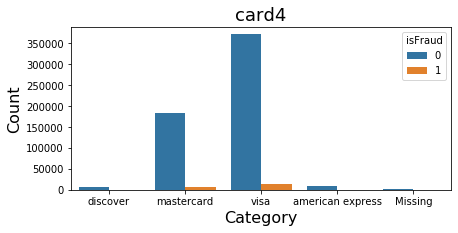

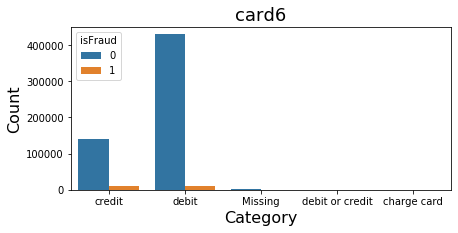

In [51]:
cd = ['card4', 'card6']
for col in cd:
    categorical(df_trans, col)

## Looking at categorical features with too many values

In [89]:
# categorical features with too many unique values to plot
vars = ['P_emaildomain', 'R_emaildomain', 'addr1', 'addr2', 'card1', 'card2', 'card3', 'card5']
df_trans[vars].describe(include = 'all' )


,P_emaildomain,R_emaildomain,addr1,addr2,card1,card2,card3,card5
count,496084,137291,524834.0,524834.0,590540.000000,581607.0,588975.0,586281.0
unique,59,60,NaN,NaN,NaN,NaN,NaN,NaN
top,gmail.com,gmail.com,NaN,NaN,NaN,NaN,NaN,NaN
freq,228355,57147,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,9898.734658,NaN,NaN,NaN
std,NaN,NaN,NaN,0.0,4901.170153,NaN,0.0,0.0
min,NaN,NaN,100.0,10.0,1000.000000,100.0,100.0,100.0
25%,NaN,NaN,204.0,87.0,6019.000000,214.0,150.0,166.0
50%,NaN,NaN,299.0,87.0,9678.000000,361.0,150.0,226.0
75%,NaN,NaN,330.0,87.0,14184.000000,512.0,150.0,226.0


## Data preprocessing

For this initial stage, the data preprocessing steps are
    
    Drop all features that have 75% or more missing values
    Check for correlations between the remaining features
    Drop features that are highly correlated (r=0.8 or more)
    Use remaining features to build an initial model.
    

In [ ]:
# drop any column that has more than 75% or more missing datapoints
cols_to_drop = col_na_group[col_na_group['perc_missing']>= 75]
cols_to_drop

In [107]:
threshold =0.75* len(df_trans)
df_complete = df_trans.dropna(axis=1, thresh=threshold)
df_complete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 191 entries, TransactionID to V321
dtypes: float16(156), float32(18), int16(1), int32(2), int8(1), object(13)
memory usage: 281.0+ MB


In [108]:
df_complete.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Model training

LightGBM, was selected for this project. 

In [150]:
# Splitting the dataset into the Training set and Test set
# drop TransactionID since it is an index and doesn't add any value to the model

X = df_trans.drop(['isFraud', 'TransactionID'], axis =1 )
y = df_trans['isFraud']

# convert categorical features to a format that lightGBM understands
for c in X.columns:
    col_type = X[c].dtype
    if col_type == 'object' or col_type.name == 'category':
        X[c] = X[c].astype('category')
# split data in to train (80%), test (20%)

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42, shuffle = False)

In [151]:
x_train, x_val, y_train, y_val = train_test_split ( x_train, y_train, test_size = 0.20, random_state = 0, shuffle = False)

In [152]:
# train_validation_test set shapes

print(x_train.shape, y_train.shape)
print (x_val.shape, y_val.shape)
print(x_test.shape, y_test.shape)

(377945, 392) (377945,)
(94487, 392) (94487,)
(118108, 392) (118108,)


In [160]:
# initial model set up

import lightgbm as lgb
train_lgbm= lgb.Dataset(x_train, label=y_train)
valid_lgbm = lgb.Dataset (x_val, label= y_val)
test_lgbm =lgb.Dataset (x_test, label =y_test)

# Model parameters 
lgb_params = {
                    'objective':'binary',
                    'boosting_type':'gbdt',
                    'metric':'auc',
                    'n_jobs':-1,
                    'learning_rate':0.01,
                    'num_leaves': 2**8,
                    'max_depth':-1,
                    'tree_learner':'serial',
                    'colsample_bytree': 0.7,
                    'subsample_freq':1,
                    'subsample':0.7,
                    'num_iterations':4000,
                    'max_bin':255,
                    'verbose':-1,
                    'seed': 42,
                    'device_type':'cpu'
                    #'early_stopping_rounds':100 
                } 

#training our model using light gbm
#num_iterations=n_estimators

model_0 = lgb.train(lgb_params, train_set = train_lgbm, valid_sets = valid_lgbm)


[1]	valid_0's auc: 0.840319
[2]	valid_0's auc: 0.86003
[3]	valid_0's auc: 0.867197
[4]	valid_0's auc: 0.869762
[5]	valid_0's auc: 0.873723
[6]	valid_0's auc: 0.874583
[7]	valid_0's auc: 0.877195
[8]	valid_0's auc: 0.878104
[9]	valid_0's auc: 0.879211
[10]	valid_0's auc: 0.879893
[11]	valid_0's auc: 0.880421
[12]	valid_0's auc: 0.881313
[13]	valid_0's auc: 0.88203
[14]	valid_0's auc: 0.883204
[15]	valid_0's auc: 0.883142
[16]	valid_0's auc: 0.883097
[17]	valid_0's auc: 0.883726
[18]	valid_0's auc: 0.88431
[19]	valid_0's auc: 0.884588
[20]	valid_0's auc: 0.884911
[21]	valid_0's auc: 0.88521
[22]	valid_0's auc: 0.885081
[23]	valid_0's auc: 0.885214
[24]	valid_0's auc: 0.88569
[25]	valid_0's auc: 0.885737
[26]	valid_0's auc: 0.886235
[27]	valid_0's auc: 0.88643
[28]	valid_0's auc: 0.886317
[29]	valid_0's auc: 0.886495
[30]	valid_0's auc: 0.886805
[31]	valid_0's auc: 0.887445
[32]	valid_0's auc: 0.887975
[33]	valid_0's auc: 0.888035
[34]	valid_0's auc: 0.887982
[35]	valid_0's auc: 0.888055


[279]	valid_0's auc: 0.922396
[280]	valid_0's auc: 0.922582
[281]	valid_0's auc: 0.92264
[282]	valid_0's auc: 0.922769
[283]	valid_0's auc: 0.922968
[284]	valid_0's auc: 0.923021
[285]	valid_0's auc: 0.923069
[286]	valid_0's auc: 0.923094
[287]	valid_0's auc: 0.923184
[288]	valid_0's auc: 0.923211
[289]	valid_0's auc: 0.923264
[290]	valid_0's auc: 0.923333
[291]	valid_0's auc: 0.923439
[292]	valid_0's auc: 0.92349
[293]	valid_0's auc: 0.923519
[294]	valid_0's auc: 0.923635
[295]	valid_0's auc: 0.923738
[296]	valid_0's auc: 0.923779
[297]	valid_0's auc: 0.923846
[298]	valid_0's auc: 0.923908
[299]	valid_0's auc: 0.924033
[300]	valid_0's auc: 0.9241
[301]	valid_0's auc: 0.924149
[302]	valid_0's auc: 0.924198
[303]	valid_0's auc: 0.924252
[304]	valid_0's auc: 0.924411
[305]	valid_0's auc: 0.924504
[306]	valid_0's auc: 0.924645
[307]	valid_0's auc: 0.924786
[308]	valid_0's auc: 0.924843
[309]	valid_0's auc: 0.924884
[310]	valid_0's auc: 0.924892
[311]	valid_0's auc: 0.925039
[312]	valid_0'

[554]	valid_0's auc: 0.933661
[555]	valid_0's auc: 0.933666
[556]	valid_0's auc: 0.933718
[557]	valid_0's auc: 0.933763
[558]	valid_0's auc: 0.933768
[559]	valid_0's auc: 0.933766
[560]	valid_0's auc: 0.933772
[561]	valid_0's auc: 0.933789
[562]	valid_0's auc: 0.933897
[563]	valid_0's auc: 0.933921
[564]	valid_0's auc: 0.933919
[565]	valid_0's auc: 0.933941
[566]	valid_0's auc: 0.933937
[567]	valid_0's auc: 0.933953
[568]	valid_0's auc: 0.933956
[569]	valid_0's auc: 0.933984
[570]	valid_0's auc: 0.934004
[571]	valid_0's auc: 0.934029
[572]	valid_0's auc: 0.934012
[573]	valid_0's auc: 0.934024
[574]	valid_0's auc: 0.933993
[575]	valid_0's auc: 0.934042
[576]	valid_0's auc: 0.934033
[577]	valid_0's auc: 0.934047
[578]	valid_0's auc: 0.934041
[579]	valid_0's auc: 0.934076
[580]	valid_0's auc: 0.934067
[581]	valid_0's auc: 0.934051
[582]	valid_0's auc: 0.934042
[583]	valid_0's auc: 0.934051
[584]	valid_0's auc: 0.934043
[585]	valid_0's auc: 0.934044
[586]	valid_0's auc: 0.93407
[587]	valid

[829]	valid_0's auc: 0.935914
[830]	valid_0's auc: 0.935893
[831]	valid_0's auc: 0.9359
[832]	valid_0's auc: 0.935892
[833]	valid_0's auc: 0.935891
[834]	valid_0's auc: 0.9359
[835]	valid_0's auc: 0.935902
[836]	valid_0's auc: 0.935899
[837]	valid_0's auc: 0.93591
[838]	valid_0's auc: 0.93591
[839]	valid_0's auc: 0.93591
[840]	valid_0's auc: 0.935915
[841]	valid_0's auc: 0.935917
[842]	valid_0's auc: 0.935928
[843]	valid_0's auc: 0.935904
[844]	valid_0's auc: 0.93593
[845]	valid_0's auc: 0.935943
[846]	valid_0's auc: 0.93594
[847]	valid_0's auc: 0.935975
[848]	valid_0's auc: 0.935993
[849]	valid_0's auc: 0.935977
[850]	valid_0's auc: 0.935996
[851]	valid_0's auc: 0.936
[852]	valid_0's auc: 0.935979
[853]	valid_0's auc: 0.935948
[854]	valid_0's auc: 0.935942
[855]	valid_0's auc: 0.935924
[856]	valid_0's auc: 0.935925
[857]	valid_0's auc: 0.935931
[858]	valid_0's auc: 0.935926
[859]	valid_0's auc: 0.935925
[860]	valid_0's auc: 0.935929
[861]	valid_0's auc: 0.935931
[862]	valid_0's auc: 0

[1101]	valid_0's auc: 0.93626
[1102]	valid_0's auc: 0.93628
[1103]	valid_0's auc: 0.936259
[1104]	valid_0's auc: 0.936287
[1105]	valid_0's auc: 0.936298
[1106]	valid_0's auc: 0.93629
[1107]	valid_0's auc: 0.936293
[1108]	valid_0's auc: 0.936284
[1109]	valid_0's auc: 0.936298
[1110]	valid_0's auc: 0.936309
[1111]	valid_0's auc: 0.936312
[1112]	valid_0's auc: 0.936331
[1113]	valid_0's auc: 0.936361
[1114]	valid_0's auc: 0.936364
[1115]	valid_0's auc: 0.936379
[1116]	valid_0's auc: 0.936374
[1117]	valid_0's auc: 0.93637
[1118]	valid_0's auc: 0.936411
[1119]	valid_0's auc: 0.936403
[1120]	valid_0's auc: 0.936406
[1121]	valid_0's auc: 0.936387
[1122]	valid_0's auc: 0.936384
[1123]	valid_0's auc: 0.9364
[1124]	valid_0's auc: 0.936397
[1125]	valid_0's auc: 0.936394
[1126]	valid_0's auc: 0.936386
[1127]	valid_0's auc: 0.936379
[1128]	valid_0's auc: 0.936396
[1129]	valid_0's auc: 0.936391
[1130]	valid_0's auc: 0.936426
[1131]	valid_0's auc: 0.936437
[1132]	valid_0's auc: 0.936422
[1133]	valid_0

[1367]	valid_0's auc: 0.936348
[1368]	valid_0's auc: 0.936333
[1369]	valid_0's auc: 0.936336
[1370]	valid_0's auc: 0.936331
[1371]	valid_0's auc: 0.936343
[1372]	valid_0's auc: 0.936339
[1373]	valid_0's auc: 0.936356
[1374]	valid_0's auc: 0.936355
[1375]	valid_0's auc: 0.936345
[1376]	valid_0's auc: 0.936348
[1377]	valid_0's auc: 0.936349
[1378]	valid_0's auc: 0.936339
[1379]	valid_0's auc: 0.936327
[1380]	valid_0's auc: 0.936319
[1381]	valid_0's auc: 0.936327
[1382]	valid_0's auc: 0.936315
[1383]	valid_0's auc: 0.936311
[1384]	valid_0's auc: 0.93632
[1385]	valid_0's auc: 0.936327
[1386]	valid_0's auc: 0.936339
[1387]	valid_0's auc: 0.936341
[1388]	valid_0's auc: 0.93633
[1389]	valid_0's auc: 0.936329
[1390]	valid_0's auc: 0.93633
[1391]	valid_0's auc: 0.93632
[1392]	valid_0's auc: 0.936335
[1393]	valid_0's auc: 0.936342
[1394]	valid_0's auc: 0.93634
[1395]	valid_0's auc: 0.936352
[1396]	valid_0's auc: 0.936334
[1397]	valid_0's auc: 0.936333
[1398]	valid_0's auc: 0.936326
[1399]	valid_

[1633]	valid_0's auc: 0.93618
[1634]	valid_0's auc: 0.93617
[1635]	valid_0's auc: 0.936177
[1636]	valid_0's auc: 0.936181
[1637]	valid_0's auc: 0.936181
[1638]	valid_0's auc: 0.936173
[1639]	valid_0's auc: 0.936175
[1640]	valid_0's auc: 0.936191
[1641]	valid_0's auc: 0.936181
[1642]	valid_0's auc: 0.936195
[1643]	valid_0's auc: 0.936198
[1644]	valid_0's auc: 0.936213
[1645]	valid_0's auc: 0.936207
[1646]	valid_0's auc: 0.936195
[1647]	valid_0's auc: 0.936205
[1648]	valid_0's auc: 0.936216
[1649]	valid_0's auc: 0.936199
[1650]	valid_0's auc: 0.936199
[1651]	valid_0's auc: 0.936184
[1652]	valid_0's auc: 0.936168
[1653]	valid_0's auc: 0.936165
[1654]	valid_0's auc: 0.936154
[1655]	valid_0's auc: 0.93614
[1656]	valid_0's auc: 0.936148
[1657]	valid_0's auc: 0.936156
[1658]	valid_0's auc: 0.936145
[1659]	valid_0's auc: 0.936154
[1660]	valid_0's auc: 0.936152
[1661]	valid_0's auc: 0.936126
[1662]	valid_0's auc: 0.936106
[1663]	valid_0's auc: 0.936099
[1664]	valid_0's auc: 0.936065
[1665]	vali

[1899]	valid_0's auc: 0.935659
[1900]	valid_0's auc: 0.935686
[1901]	valid_0's auc: 0.93567
[1902]	valid_0's auc: 0.935671
[1903]	valid_0's auc: 0.935673
[1904]	valid_0's auc: 0.935682
[1905]	valid_0's auc: 0.935682
[1906]	valid_0's auc: 0.935675
[1907]	valid_0's auc: 0.935679
[1908]	valid_0's auc: 0.935669
[1909]	valid_0's auc: 0.935653
[1910]	valid_0's auc: 0.935645
[1911]	valid_0's auc: 0.935623
[1912]	valid_0's auc: 0.935631
[1913]	valid_0's auc: 0.935642
[1914]	valid_0's auc: 0.935638
[1915]	valid_0's auc: 0.935636
[1916]	valid_0's auc: 0.935629
[1917]	valid_0's auc: 0.935627
[1918]	valid_0's auc: 0.93563
[1919]	valid_0's auc: 0.935619
[1920]	valid_0's auc: 0.935599
[1921]	valid_0's auc: 0.9356
[1922]	valid_0's auc: 0.935578
[1923]	valid_0's auc: 0.935563
[1924]	valid_0's auc: 0.935558
[1925]	valid_0's auc: 0.935577
[1926]	valid_0's auc: 0.935574
[1927]	valid_0's auc: 0.935576
[1928]	valid_0's auc: 0.935572
[1929]	valid_0's auc: 0.935581
[1930]	valid_0's auc: 0.935588
[1931]	valid

[2165]	valid_0's auc: 0.935175
[2166]	valid_0's auc: 0.935171
[2167]	valid_0's auc: 0.9352
[2168]	valid_0's auc: 0.935204
[2169]	valid_0's auc: 0.935203
[2170]	valid_0's auc: 0.935215
[2171]	valid_0's auc: 0.935203
[2172]	valid_0's auc: 0.935197
[2173]	valid_0's auc: 0.935201
[2174]	valid_0's auc: 0.935187
[2175]	valid_0's auc: 0.935184
[2176]	valid_0's auc: 0.935184
[2177]	valid_0's auc: 0.935183
[2178]	valid_0's auc: 0.935203
[2179]	valid_0's auc: 0.935215
[2180]	valid_0's auc: 0.935224
[2181]	valid_0's auc: 0.935224
[2182]	valid_0's auc: 0.93523
[2183]	valid_0's auc: 0.93522
[2184]	valid_0's auc: 0.935221
[2185]	valid_0's auc: 0.935219
[2186]	valid_0's auc: 0.935222
[2187]	valid_0's auc: 0.935222
[2188]	valid_0's auc: 0.935228
[2189]	valid_0's auc: 0.935227
[2190]	valid_0's auc: 0.935232
[2191]	valid_0's auc: 0.935235
[2192]	valid_0's auc: 0.935233
[2193]	valid_0's auc: 0.935234
[2194]	valid_0's auc: 0.935238
[2195]	valid_0's auc: 0.935202
[2196]	valid_0's auc: 0.935199
[2197]	valid

[2430]	valid_0's auc: 0.934787
[2431]	valid_0's auc: 0.93479
[2432]	valid_0's auc: 0.934783
[2433]	valid_0's auc: 0.934779
[2434]	valid_0's auc: 0.934771
[2435]	valid_0's auc: 0.934782
[2436]	valid_0's auc: 0.934783
[2437]	valid_0's auc: 0.934775
[2438]	valid_0's auc: 0.93478
[2439]	valid_0's auc: 0.934778
[2440]	valid_0's auc: 0.934771
[2441]	valid_0's auc: 0.934763
[2442]	valid_0's auc: 0.934755
[2443]	valid_0's auc: 0.934774
[2444]	valid_0's auc: 0.934781
[2445]	valid_0's auc: 0.934789
[2446]	valid_0's auc: 0.934792
[2447]	valid_0's auc: 0.9348
[2448]	valid_0's auc: 0.9348
[2449]	valid_0's auc: 0.934798
[2450]	valid_0's auc: 0.934792
[2451]	valid_0's auc: 0.934791
[2452]	valid_0's auc: 0.934784
[2453]	valid_0's auc: 0.934789
[2454]	valid_0's auc: 0.934787
[2455]	valid_0's auc: 0.93479
[2456]	valid_0's auc: 0.934784
[2457]	valid_0's auc: 0.93477
[2458]	valid_0's auc: 0.934769
[2459]	valid_0's auc: 0.934773
[2460]	valid_0's auc: 0.934768
[2461]	valid_0's auc: 0.934773
[2462]	valid_0's

[2696]	valid_0's auc: 0.934511
[2697]	valid_0's auc: 0.93451
[2698]	valid_0's auc: 0.934511
[2699]	valid_0's auc: 0.934509
[2700]	valid_0's auc: 0.934511
[2701]	valid_0's auc: 0.934511
[2702]	valid_0's auc: 0.934503
[2703]	valid_0's auc: 0.934505
[2704]	valid_0's auc: 0.934489
[2705]	valid_0's auc: 0.934508
[2706]	valid_0's auc: 0.934513
[2707]	valid_0's auc: 0.934526
[2708]	valid_0's auc: 0.934523
[2709]	valid_0's auc: 0.934514
[2710]	valid_0's auc: 0.934522
[2711]	valid_0's auc: 0.934519
[2712]	valid_0's auc: 0.934523
[2713]	valid_0's auc: 0.934508
[2714]	valid_0's auc: 0.934504
[2715]	valid_0's auc: 0.93451
[2716]	valid_0's auc: 0.934507
[2717]	valid_0's auc: 0.934507
[2718]	valid_0's auc: 0.934506
[2719]	valid_0's auc: 0.93451
[2720]	valid_0's auc: 0.934486
[2721]	valid_0's auc: 0.934491
[2722]	valid_0's auc: 0.934496
[2723]	valid_0's auc: 0.934497
[2724]	valid_0's auc: 0.934506
[2725]	valid_0's auc: 0.934521
[2726]	valid_0's auc: 0.934517
[2727]	valid_0's auc: 0.934523
[2728]	vali

[2961]	valid_0's auc: 0.934127
[2962]	valid_0's auc: 0.934133
[2963]	valid_0's auc: 0.934128
[2964]	valid_0's auc: 0.934121
[2965]	valid_0's auc: 0.934121
[2966]	valid_0's auc: 0.934118
[2967]	valid_0's auc: 0.934129
[2968]	valid_0's auc: 0.934135
[2969]	valid_0's auc: 0.934127
[2970]	valid_0's auc: 0.934126
[2971]	valid_0's auc: 0.934129
[2972]	valid_0's auc: 0.934114
[2973]	valid_0's auc: 0.934116
[2974]	valid_0's auc: 0.934116
[2975]	valid_0's auc: 0.934111
[2976]	valid_0's auc: 0.934103
[2977]	valid_0's auc: 0.934108
[2978]	valid_0's auc: 0.934095
[2979]	valid_0's auc: 0.934091
[2980]	valid_0's auc: 0.934085
[2981]	valid_0's auc: 0.934085
[2982]	valid_0's auc: 0.93408
[2983]	valid_0's auc: 0.934068
[2984]	valid_0's auc: 0.934069
[2985]	valid_0's auc: 0.934066
[2986]	valid_0's auc: 0.934063
[2987]	valid_0's auc: 0.934058
[2988]	valid_0's auc: 0.934058
[2989]	valid_0's auc: 0.934059
[2990]	valid_0's auc: 0.934062
[2991]	valid_0's auc: 0.934069
[2992]	valid_0's auc: 0.934079
[2993]	va

[3227]	valid_0's auc: 0.933941
[3228]	valid_0's auc: 0.933945
[3229]	valid_0's auc: 0.933945
[3230]	valid_0's auc: 0.933958
[3231]	valid_0's auc: 0.933969
[3232]	valid_0's auc: 0.933957
[3233]	valid_0's auc: 0.933961
[3234]	valid_0's auc: 0.93396
[3235]	valid_0's auc: 0.93395
[3236]	valid_0's auc: 0.933944
[3237]	valid_0's auc: 0.933925
[3238]	valid_0's auc: 0.933887
[3239]	valid_0's auc: 0.933877
[3240]	valid_0's auc: 0.933879
[3241]	valid_0's auc: 0.933873
[3242]	valid_0's auc: 0.933862
[3243]	valid_0's auc: 0.933865
[3244]	valid_0's auc: 0.933873
[3245]	valid_0's auc: 0.933862
[3246]	valid_0's auc: 0.933858
[3247]	valid_0's auc: 0.933854
[3248]	valid_0's auc: 0.933878
[3249]	valid_0's auc: 0.933876
[3250]	valid_0's auc: 0.933869
[3251]	valid_0's auc: 0.933884
[3252]	valid_0's auc: 0.933877
[3253]	valid_0's auc: 0.933886
[3254]	valid_0's auc: 0.933901
[3255]	valid_0's auc: 0.933908
[3256]	valid_0's auc: 0.93392
[3257]	valid_0's auc: 0.933919
[3258]	valid_0's auc: 0.933915
[3259]	vali

[3493]	valid_0's auc: 0.933898
[3494]	valid_0's auc: 0.9339
[3495]	valid_0's auc: 0.933897
[3496]	valid_0's auc: 0.933904
[3497]	valid_0's auc: 0.933897
[3498]	valid_0's auc: 0.933896
[3499]	valid_0's auc: 0.933894
[3500]	valid_0's auc: 0.933881
[3501]	valid_0's auc: 0.933888
[3502]	valid_0's auc: 0.933896
[3503]	valid_0's auc: 0.933894
[3504]	valid_0's auc: 0.933891
[3505]	valid_0's auc: 0.933898
[3506]	valid_0's auc: 0.933918
[3507]	valid_0's auc: 0.933922
[3508]	valid_0's auc: 0.933915
[3509]	valid_0's auc: 0.933924
[3510]	valid_0's auc: 0.933929
[3511]	valid_0's auc: 0.933941
[3512]	valid_0's auc: 0.933939
[3513]	valid_0's auc: 0.933941
[3514]	valid_0's auc: 0.933936
[3515]	valid_0's auc: 0.933932
[3516]	valid_0's auc: 0.933933
[3517]	valid_0's auc: 0.93392
[3518]	valid_0's auc: 0.933902
[3519]	valid_0's auc: 0.93388
[3520]	valid_0's auc: 0.933881
[3521]	valid_0's auc: 0.933882
[3522]	valid_0's auc: 0.933881
[3523]	valid_0's auc: 0.933876
[3524]	valid_0's auc: 0.933893
[3525]	valid

[3759]	valid_0's auc: 0.933893
[3760]	valid_0's auc: 0.933905
[3761]	valid_0's auc: 0.933901
[3762]	valid_0's auc: 0.933921
[3763]	valid_0's auc: 0.933916
[3764]	valid_0's auc: 0.933925
[3765]	valid_0's auc: 0.933933
[3766]	valid_0's auc: 0.933943
[3767]	valid_0's auc: 0.933924
[3768]	valid_0's auc: 0.933903
[3769]	valid_0's auc: 0.933907
[3770]	valid_0's auc: 0.933911
[3771]	valid_0's auc: 0.933902
[3772]	valid_0's auc: 0.933897
[3773]	valid_0's auc: 0.933892
[3774]	valid_0's auc: 0.933884
[3775]	valid_0's auc: 0.933881
[3776]	valid_0's auc: 0.933878
[3777]	valid_0's auc: 0.93387
[3778]	valid_0's auc: 0.933853
[3779]	valid_0's auc: 0.933851
[3780]	valid_0's auc: 0.933854
[3781]	valid_0's auc: 0.933859
[3782]	valid_0's auc: 0.933853
[3783]	valid_0's auc: 0.933846
[3784]	valid_0's auc: 0.933835
[3785]	valid_0's auc: 0.933831
[3786]	valid_0's auc: 0.93384
[3787]	valid_0's auc: 0.933851
[3788]	valid_0's auc: 0.933845
[3789]	valid_0's auc: 0.933852
[3790]	valid_0's auc: 0.933841
[3791]	val

In [161]:
#Prediction

y_pred=model_0.predict(x_test)

#convert into binary values

for i in range(0,len(y_test)):
    if y_pred[i]>=.5:       # setting threshold to .5
       y_pred[i]=1
    else:  
       y_pred[i]=0
y_pred[0:5]  # showing first 5 predictions


array([0., 0., 0., 0., 0.])

In [162]:
#Evaluation

from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score

accuracy=accuracy_score(y_pred,y_test)
y_test.value_counts()
accuracy

#calculating roc_auc_score for light gbm.

auc = roc_auc_score(y_test,y_pred)


In [163]:
auc

0.659587449946795